# Spatial Analysis

## Getting Started

### Importing Libraries

In [68]:
# to read and wrangle data
import pandas as pd

# to create spatial data
import geopandas as gpd
from geopandas import GeoDataFrame

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

# new for data viz
import seaborn as sns

# to explore point patterns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy

# interact library
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

### Importing Data

In [2]:
#import data
parks=gpd.read_file('data/LA_Parks_Information.geojson')
encamp_19=gpd.read_file('data/2019-311_Homeless_Encampments_Requests-raw.csv')
resources=gpd.read_file('data/Countywide_Parks_and_Open_Space__Public_-_Hosted_.csv')
city=gpd.read_file('data/la-city-council-districts-2012.geojson')
tract_shape=gpd.read_file('data/LA_tracts.geojson')

## Cleaning Data

### Parks Data

In [3]:
#Clean parks data
#drop non-existent CDs
parks=parks.sort_values(by='cd_real',ascending = False)
parks['cd_real'] = parks['cd_real'].astype(int)
parks_la=parks[parks['cd_real']<=16]
parks_la=parks_la.sort_values(by='cd_real',ascending = True)
#drop unnecessary columns
columns_to_drop = ['objectid',
                   'park_id',
                   'name_alpha',
                   'region',
                   'name_publi',
                   'park_class']
parks_la = parks_la.drop(columns_to_drop,axis=1)
#reset index
parks_la.reset_index(inplace=True)
parks_la = parks_la.rename(columns = {'index':'park_id'})
parks_la.head()

,park_id,name,shape_area,shape_leng,area_acres,issubpark,address,cd_real,geometry
0,471,Vista Hermosa Soccer Field,81856.4316403,1293.65778036,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569..."
1,453,Ernest E Debs Regional Park,13879064.2613,26943.5567173,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879..."
2,65,Cleland Avenue Bicentennial Park,40077.2540351,1363.12458794,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118..."
3,1,Sycamore Grove Park,691462.199493,6227.3991903,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
4,422,Downey Pool,45451.0029074,941.017165962,1.043415627,Y,"1775 N Spring St, LA 90031",1,"MULTIPOLYGON (((-118.22394 34.07113, -118.2240..."


### Encampment Data

In [4]:
#Clean encampment data
#drop unnecessary columns
columns_to_drop = ['SRNumber',
                   'UpdatedDate',
                   'ActionTaken',
                   'Owner',
                   'RequestType',
                   'Status',
                   'RequestSource',
                   'Anonymous',
                   'AssignTo',
                   'ServiceDate',
                   'ClosedDate',
                   'Address',
                   'HouseNumber',
                   'Direction',
                   'StreetName',
                   'Suffix',
                   'ZipCode',
                   'Location',
                   'CreatedByUserOrganization',
                   'MobileOS',
                   'TBMPage',
                   'TBMColumn',
                   'TBMRow']
encamp_19 = encamp_19.drop(columns_to_drop,axis=1)
#rename in lower case
encamp_19.columns = ['created',
                     'loc_verified',
                     'approx_loc',
                     'lat',
                     'long',
                     'apc',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precinct',
                     'geometry']
encamp_19.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry
0,8/26/2019 13:56,Y,N,33.70633171,-118.2929289,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
1,2/23/2019 12:47,Y,N,33.70971583,-118.2864142,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
2,6/30/2019 21:42,Y,,33.71047284,-118.2862046,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
3,6/30/2019 17:34,Y,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
4,7/2/2019 15:15,Y,,33.71372994,-118.293106,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None


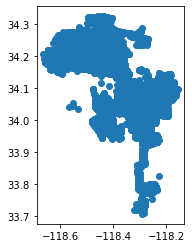

In [5]:
#add geometry to encampments
g_encamp_19 = gpd.GeoDataFrame(
    encamp_19, geometry=gpd.points_from_xy(encamp_19.long, encamp_19.lat))
#match crs
encamp_19=encamp_19.set_crs("EPSG:4326")
encamp_19.crs
encamp_19.plot() 

### Park Amenities/Resources Data

In [6]:
#clean park amenities
#drop unnecessary columns
columns_to_drop = ['OBJECTID',
                   'RPT_ACRES',
                   'UNIT_ID',
                   'LMS_ID',
                   'PARK_LBL',
                   'GIS_ACRES',
                   'AGNCY_NAME',
                   'ZIP','HOURS',
                   'DGPRK',
                   'GYM',
                   'PHONES',
                   'IS_COUNTY',
                   'PLGND',
                   'POOLS',
                   'Shape__Area',
                   'Shape__Length',
                   'FITZN',
                   'MPFLD',
                   'ADDRESS',
                   'CITY',
                   'SK8PK',
                   'TENIS',
                   'BSKTB',
                   'BASEB',
                   'MPFLD',
                   'SOCCR',
                   'TOTAL_GOOD',
                   'AGNCY_TYP',
                   'AGNCY_LEV',
                   'AGNCY_WEB',
                   'TKIT_SUM',
                   'PRKINF_CND',
                   'AM_TRLS',
                   'TRLS_MI',
                   'SPPAD',
                   'MNG_AGENCY',
                   'NDS_AN_TYP',
                   'NEEDS_ANLZ',
                   'SNRCT',
                   'AMEN_RPT',
                   'COMCT',
                   'AM_OPNSP',
                   'TOTAL_FAIR',
                   'TYPE',
                   'TOTAL_POOR']
resources = resources.drop(columns_to_drop,axis=1)
#rename in lower case
#and we are all clean!
resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'center_lat',
                     'center_long',
                     'geometry']
resources.head()

,name,access,type,picnic,restroom,center_lat,center_long,geometry
0,El Barrio Park,Open Access,Pocket Park,0,1,34.09708079,-117.70442319,None
1,El Dorado Park,Open Access,Neighborhood Park,0,1,34.69157769,-118.12210927,None
2,Atlantic Avenue Park,Open Access,Pocket,2,1,34.02530363,-118.15520092,None
3,El Escorpion Park,Open Access,Community Regional Park,0,0,34.19674178,-118.6641685,None
4,El Marino Park/ El Marino Elementary,Open Access,Pocket Park,2,0,33.99251602,-118.3992332,None


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

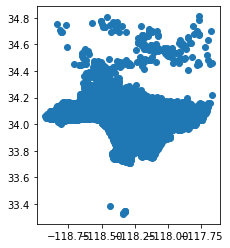

In [7]:
#add resource geometry to make plotable
#and eventually able to merge with park shape
g_resources = gpd.GeoDataFrame(
    resources, geometry=gpd.points_from_xy(resources.center_long, resources.center_lat))
resources.plot() 
resources=resources.set_crs("EPSG:4326")
resources.crs

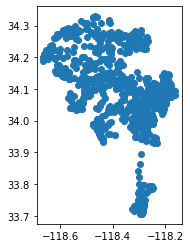

In [8]:
#only include resources within City of LA boundaries.
city=city.set_crs("EPSG:4326")
la_resources = gpd.sjoin(resources, city)
la_resources.plot()

In [9]:
#cleanup
columns_to_drop = ['center_lat',
                   'center_long',
                   'index_right',
                   'kind',
                   'external_id',
                   'name_right',
                   'slug',
                   'set',
                   'metadata',
                   'resource_uri']
la_resources = la_resources.drop(columns_to_drop,axis=1)
la_resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'geometry']
la_resources.head()

,name,access,type,picnic,restroom,geometry
3,El Escorpion Park,Open Access,Community Regional Park,0,0,POINT (-118.66417 34.19674)
33,Garden of the Gods,Open Access,Not Analyzed,0,0,POINT (-118.61100 34.27324)
34,Garden of the Gods Park,Open Access,Community Regional Park,0,0,POINT (-118.60171 34.27451)
50,Gothic Rinaldi Park,Open Access,Not Analyzed,0,0,POINT (-118.48131 34.27801)
51,Granada Hills Park,Open Access,Community Park,1,1,POINT (-118.49679 34.26288)


,park_id,name_left,shape_area,shape_leng,area_acres,issubpark,address,cd_real,geometry,index_right,name_right,access,type,picnic,restroom
0,471,Vista Hermosa Soccer Field,81856.4316403,1293.65778036,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569...",2168,Vista Hermosa Soccer Field,Open Access,Special Use,0,1
1,453,Ernest E Debs Regional Park,13879064.2613,26943.5567173,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",1003,Ernest E Debs RP,Open Access,Regional Park,2,4
2,65,Cleland Avenue Bicentennial Park,40077.2540351,1363.12458794,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118...",1645,Cleland Ave Bicentennial Park,Open Access,Pocket Park,0,0
3,1,Sycamore Grove Park,691462.199493,6227.3991903,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011...",1005,Sycamore Grove Park,Open Access,Community Park,1,1
5,175,Normandie Recreation Center,142508.174306,1575.55772808,3.27155060469,N,"1550 S Normandie Ave, LA 90006",1,"MULTIPOLYGON (((-118.30014 34.04536, -118.2992...",288,Normandie Playground,Open Access,Neighborhood Park,0,0


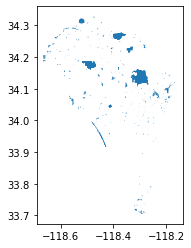

In [10]:
#join resources to parks
park_info = gpd.sjoin(parks_la, la_resources)
park_info.plot()
park_info.head()

In [11]:
#drop subparks
park_info=park_info[park_info['issubpark']=="N"]
#and clean up
columns_to_drop = ['park_id',
                   'index_right',
                    'name_right',
                    'shape_leng',
                    'issubpark']
park_info = park_info.drop(columns_to_drop,axis=1)
park_info.columns = ['name',
                     'park_area',
                     'park_acres',
                     'address',
                     'cd',
                     'geometry',
                     'access',
                     'type',
                     'picnic',
                     'restroom']

# Analyzing Park Based Encampment Reports

## Spatially join parks and encampment reports, adding frequency

In [12]:
#measure encampment reports in parks
park_info['geometry']=park_info.geometry.buffer(.001)
park_encamp = gpd.sjoin(park_info, encamp_19)
park_encamp.head()

<ipython-input-12-afb8fd11bd88>:2: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  park_info['geometry']=park_info.geometry.buffer(.001)


,name,park_area,park_acres,address,cd_left,geometry,access,type,picnic,restroom,...,loc_verified,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,"1301 W 1st St, LA 90026",1,"POLYGON ((-118.25821 34.06040, -118.25828 34.0...",Open Access,Special Use,0,1,...,Y,N,34.06169109,-118.2584893,Central APC,1,Gilbert Cedillo,44,GREATER ECHO PARK ELYSIAN NC,RAMPART
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",Open Access,Regional Park,2,4,...,Y,Y,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",Open Access,Regional Park,2,4,...,Y,,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",Open Access,Regional Park,2,4,...,Y,,34.10171405,-118.2013037,East Los Angeles APC,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST
3,Sycamore Grove Park,691462.199493,15.8738513625,"4702 N Figueroa St, LA 90042",1,"POLYGON ((-118.20579 34.09726, -118.20581 34.0...",Open Access,Community Park,1,1,...,Y,,34.10171405,-118.2013037,East Los Angeles APC,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST


In [13]:
#add a frequency column
park_encamp['freq'] = park_encamp['name'].map(park_encamp['name'].value_counts())
park_encamp.head()
#and dissolve down since we have our freq count
park_encamp_diss = park_encamp.dissolve(by='name')
#we also need to reset the index
park_encamp_diss = park_encamp_diss.reset_index()
#sort
park_encamp_diss=park_encamp_diss.sort_values(by='name',ascending = True)
park_encamp_diss

,name,geometry,park_area,park_acres,address,cd_left,access,type,picnic,restroom,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
0,1st And Broadway Civic Center Park (TBD),"POLYGON ((-118.24549 34.05495, -118.24542 34.0...",85532.956018,1.96357433772,"217 W 1st St, LA 90012",14,Open Access,Pocket Park,0,0,...,N,34.05292846,-118.2444975,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,34
1,49th Street Pocket Park,"POLYGON ((-118.26344 33.99957, -118.26334 33.9...",8250.43763411,0.189404743709,"670 E 49Th St, LA 90011",9,Open Access,Park Node,0,0,...,N,33.9984056,-118.2645197,South Los Angeles APC,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2
2,6th & Gladys Street Park,"POLYGON ((-118.24165 34.03942, -118.24170 34.0...",14823.490385,0.340301875096,"624 E 6th Street, LA 90021",14,Open Access,Pocket Park,1,0,...,N,34.04004454,-118.2421345,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,37
3,76th Street Pocket Park,"POLYGON ((-118.28833 33.96982, -118.28843 33.9...",5591.97634123,0.128374626015,"833 W 76th St, LA 90044",8,Open Access,Park Node,2,0,...,N,33.97051712,-118.2880114,South Los Angeles APC,8,Marqueece Harris-Dawson,123,UNITED FOR VICTORY,77TH STREET,2
4,Albert Piantanida Intergenerational Center,"POLYGON ((-118.44815 34.24514, -118.44805 34.2...",115992.665239,2.66283584046,"9540 N Van Nuys Blvd, Panorama City 91402",6,Restricted Access,Pocket Park,0,0,...,,34.24265591,-118.4502828,North Valley APC,6,Nury Martinez,100,PANORAMA CITY NC,MISSION,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,Woodbridge Park,"POLYGON ((-118.37770 34.14885, -118.37770 34.1...",205047.436648,4.70726025805,"11240 W Moorpark St, Studio City 91602",2,Open Access,Neighborhood Park,2,0,...,,34.15018104,-118.3765292,South Valley APC,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,55
272,Woodland Hills Recreation Center,"POLYGON ((-118.61386 34.17465, -118.61438 34.1...",817168.061747,18.7596724157,"5858 N Shoup Ave, Woodland Hills 91367",3,Open Access,Community Park,0,0,...,,34.17471315,-118.6127447,South Valley APC,3,Bob Blumenfield,16,WOODLAND HILLS-WARNER CENTER NC,TOPANGA,3
273,Woodside Triangle,"POLYGON ((-118.20650 34.09950, -118.20641 34.0...",7562.9668937,0.173622524005,Woodside Dr & Marmion Way,1,Open Access,Not Analyzed,0,0,...,N,34.09815761,-118.2054158,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,NORTHEAST,4
274,York Blvd Pocket Park,"POLYGON ((-118.20610 34.12106, -118.20611 34.1...",12788.6660416,0.293588549046,"4948-4956 E York Blvd, LA 90042",14,Open Access,Pocket Park,0,1,...,,34.12132717,-118.2073718,East Los Angeles APC,14,Jose Huizar,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2


In [14]:
#make sure we are in mercator
park_encamp_diss = park_encamp_diss.to_crs(epsg=3857)

,name,geometry,park_area,park_acres,address,cd_left,access,type,picnic,restroom,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
0,1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.96357433772,"217 W 1st St, LA 90012",14,Open Access,Pocket Park,0,0,...,N,34.05292846,-118.2444975,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,34
1,49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189404743709,"670 E 49Th St, LA 90011",9,Open Access,Park Node,0,0,...,N,33.9984056,-118.2645197,South Los Angeles APC,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2
2,6th & Gladys Street Park,"POLYGON ((-13162600.766 4034096.386, -13162605...",14823.490385,0.340301875096,"624 E 6th Street, LA 90021",14,Open Access,Pocket Park,1,0,...,N,34.04004454,-118.2421345,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,37
3,76th Street Pocket Park,"POLYGON ((-13167796.518 4024749.976, -13167807...",5591.97634123,0.128374626015,"833 W 76th St, LA 90044",8,Open Access,Park Node,2,0,...,N,33.97051712,-118.2880114,South Los Angeles APC,8,Marqueece Harris-Dawson,123,UNITED FOR VICTORY,77TH STREET,2
4,Albert Piantanida Intergenerational Center,"POLYGON ((-13185588.013 4061765.495, -13185577...",115992.665239,2.66283584046,"9540 N Van Nuys Blvd, Panorama City 91402",6,Restricted Access,Pocket Park,0,0,...,,34.24265591,-118.4502828,North Valley APC,6,Nury Martinez,100,PANORAMA CITY NC,MISSION,11


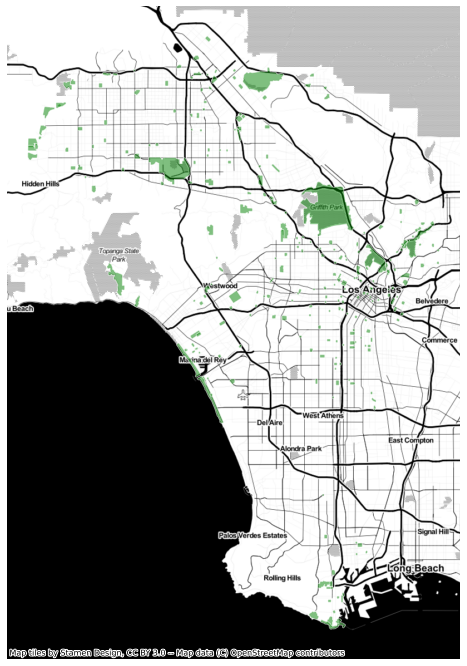

In [15]:
#let's see how this is looking
ax=park_encamp_diss.plot(figsize=(12,12),
                      color='Green', 
                      edgecolor='white',
                      alpha=0.5)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.Stamen.Toner)
park_encamp_diss.head()

In [16]:
#some columns are not accurate anymore
#like encampment details, since we dissolved
#time to clean some more!
columns_to_drop = ['cd_left',
                   'index_right',
                   'created',
                    'loc_verified',
                    'approx_loc',
                    'lat',
                    'long',
                    'apc'
                        ]
park_encamp_diss = park_encamp_diss.drop(columns_to_drop,axis=1)
park_encamp_diss.columns = ['name',
                     'geometry',
                     'park_area',
                     'park_acres',
                     'address',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precinct',
                     'freq'
                       ]
park_encamp_diss.head()

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq
0,1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.96357433772,"217 W 1st St, LA 90012",Open Access,Pocket Park,0,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,34
1,49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189404743709,"670 E 49Th St, LA 90011",Open Access,Park Node,0,0,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2
2,6th & Gladys Street Park,"POLYGON ((-13162600.766 4034096.386, -13162605...",14823.490385,0.340301875096,"624 E 6th Street, LA 90021",Open Access,Pocket Park,1,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,37
3,76th Street Pocket Park,"POLYGON ((-13167796.518 4024749.976, -13167807...",5591.97634123,0.128374626015,"833 W 76th St, LA 90044",Open Access,Park Node,2,0,8,Marqueece Harris-Dawson,123,UNITED FOR VICTORY,77TH STREET,2
4,Albert Piantanida Intergenerational Center,"POLYGON ((-13185588.013 4061765.495, -13185577...",115992.665239,2.66283584046,"9540 N Van Nuys Blvd, Panorama City 91402",Restricted Access,Pocket Park,0,0,6,Nury Martinez,100,PANORAMA CITY NC,MISSION,11


## Common site of Park-Based Encampment Reports

In [17]:
# make a bar chart of top 10 parks with encampments
park_encamp_diss = park_encamp_diss.sort_values(by='freq',ascending=False)
chart=px.bar(park_encamp_diss[:10],
       x='name',
       y='freq',
       color='type',
       title='Top 10 LA Parks by Number of Encampment Reports',
       labels={'name':"Park Name",'freq':"Number of Encampment Reports", 'type':"Park Type"}
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)
chart.update_traces(marker_line_width=0)

## Normalize by dividing encampment reports by # of acres

In [18]:
#find encampments per acre
#I don't need a separate dataframe so simplifying name
park_encamp_diss['park_acres'] = park_encamp_diss['park_acres'].astype(float)
park_encamp_diss['encamp_per_acre']=park_encamp_diss['freq']/park_encamp_diss['park_acres']
park_encamp_diss.head()

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre
207,Sepulveda Basin Recreation Area,"POLYGON ((-13193503.564 4053689.915, -13193505...",67021260.0218,1538.602574,"17017 W Burbank Blvd, Encino 91316",Open Access,Community Regional Park,0,0,6,Nury Martinez,19,LAKE BALBOA NC,WEST VALLEY,2030,1.319379
95,Hansen Dam Recreation Area,"POLYGON ((-13180521.041 4064343.270, -13180522...",63141934.6725,1449.545162,"12074 W Osborne St, Lake View Terrace 91342",Restricted Access,Not Analyzed,0,0,7,Monica Rodriguez,9,FOOTHILL TRAILS DISTRICT NC,FOOTHILL,365,0.251803
211,Shatto Recreation Center,"POLYGON ((-13167986.847 4038096.905, -13167977...",237571.355728,5.453910,"3191 W 4th St, LA 90020",Open Access,Neighborhood Park,0,1,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,320,58.673505
92,Griffith Park,"POLYGON ((-13172445.568 4047992.150, -13172443...",186526113.705,4282.668740,"4730 N Crystal Springs Dr, LA 90027",No Public Access,Not Analyzed,0,0,4,David Ryu,36,LOS FELIZ NC,NORTHEAST,270,0.063045
247,Venice Beach,"POLYGON ((-13189430.356 4028419.002, -13189420...",7002380.33585,160.753176,"2300 S Ocean Front Walk, Venice 90291",Open Access,Neighborhood Park,0,0,11,Mike Bonin,68,VENICE NC,PACIFIC,172,1.069963


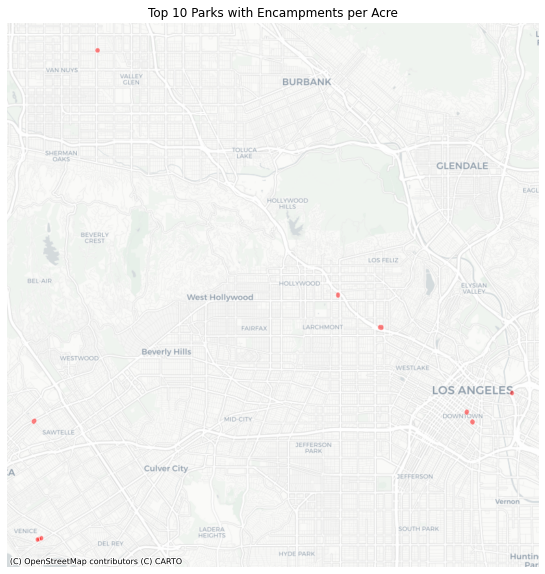

In [19]:
# map the top 10 parks
ax = park_encamp_diss.sort_values(by='encamp_per_acre',ascending=False)[:10].plot(figsize=(12,10),
                                                             color='red',
                                                             edgecolor='white',
                                                             alpha=0.5)


# title
ax.set_title('Top 10 Parks with Encampments per Acre')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### The trouble with normalizing

As expected, normalizing everything by park size does not do much. Why? Because tiny pocket parks and park nodes are going to see hyper-inflated numbers - and these are already the park types where it was questioned if the 1/2 block buffer zone is productive. Given that the point of this project is to think about areas to concentrate park-based services for park-based encampments as well as housed users, let's drop these park types and try again. Given that so many park types are unreported, we may still see issues - but we can filter by size then if necessary.

### Normalizing without Pocket Parks and Park Nodes

In [20]:
#sort by encampments per acre
park_encamp_diss=park_encamp_diss.sort_values(by='encamp_per_acre',ascending = False)
#drop pocket parks and park nodes
park_encamp_large = park_encamp_diss[park_encamp_diss['type']!="Pocket Park"]
park_encamp_large = park_encamp_diss[park_encamp_diss['type']!="Park Node"]
park_encamp_large.head()

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre
145,Marco Triangle,"POLYGON ((-13186900.755 4027523.540, -13186911...",1467.23312952,0.033683,Marco Place near intersection with Shell Ave,Open Access,Not Analyzed,0,0,11,Mike Bonin,68,VENICE NC,PACIFIC,23,682.833540
49,Crescent Place Triangle,"POLYGON ((-13187022.443 4027494.806, -13187024...",706.857242364,0.016227,"1646 S Crescent Pl, Venice 90291",Open Access,Not Analyzed,0,0,11,Mike Bonin,68,VENICE NC,PACIFIC,10,616.246438
201,San Julian Park,"POLYGON ((-13163087.089 4034625.330, -13163096...",12749.9878853,0.292701,"312 E 5Th St, LA 90013",Open Access,Pocket Park,2,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,44,150.324247
9,Amoroso Triangle,"POLYGON ((-13186854.146 4027586.929, -13186863...",1200.05747108,0.027550,"Amoroso Pl Btwn Oakwood / Shell Ave, LA 90291",Open Access,Not Analyzed,0,0,11,Mike Bonin,68,VENICE NC,PACIFIC,4,145.192466
98,Hartland Mini-Park,"POLYGON ((-13183634.057 4055125.003, -13183623...",2873.7854301,0.065973,"6830 N Woodman Ave, Van Nuys 91405",Open Access,Not Analyzed,0,0,2,Paul Krekorian,20,VAN NUYS NC,VAN NUYS,9,136.418825


### Normalizing wihtout parks under 3 acres

In [21]:
#See how thes above are all triangles or mini-parks? Same problem.
#Ex, Marco traingle is presumably picking up encampments along Venice Blvd
#let's filter for size. Pocket parks and nodes are under 3 acres.
park_encamp_large = park_encamp_large[park_encamp_large['park_acres']>=3]
park_encamp_large.head()

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre
211,Shatto Recreation Center,"POLYGON ((-13167986.847 4038096.905, -13167977...",237571.355728,5.453910,"3191 W 4th St, LA 90020",Open Access,Neighborhood Park,0,1,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,320,58.673505
175,Pershing Square,"POLYGON ((-13164035.567 4035141.724, -13164044...",193273.841037,4.436975,"525 S Olive St, LA 90013",Open Access,Neighborhood Park,0,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,151,34.032198
202,San Pedro Plaza Park,"POLYGON ((-13166974.258 3992825.568, -13166980...",152749.805211,3.506667,"700 S Beacon St, San Pedro 90731",Open Access,Pocket Park,0,0,15,Joe Buscaino,95,CENTRAL SAN PEDRO NC,HARBOR,67,19.106462
154,Moorpark Park,"POLYGON ((-13179505.802 4049176.348, -13179502...",140135.18061,3.217074,"12061 W Moorpark St, Studio City 91604",Open Access,Pocket Park,0,0,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,41,12.744500
100,Highland Park Recreation Center,"POLYGON ((-13156560.031 4043777.979, -13156571...",235761.621543,5.412364,"6150 E Piedmont Ave, LA 90042",Open Access,Neighborhood Park,0,0,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,66,12.194302


In [22]:
# what are the top 10 parks by encampment reports/acre?
park_encamp_large = park_encamp_large.sort_values(by='encamp_per_acre',ascending=False)
chart=px.bar(park_encamp_large[:10],
       x='name',
       y='encamp_per_acre',
       color='type',
       title='Top 10 LA Parks by Encampment Reports per Acre',
       labels={'name':"Park Name",'encamp_per_acre':"Encampment Reports per Acre", 'type':"Park Type"}
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)
chart.update_traces(marker_line_width=0)

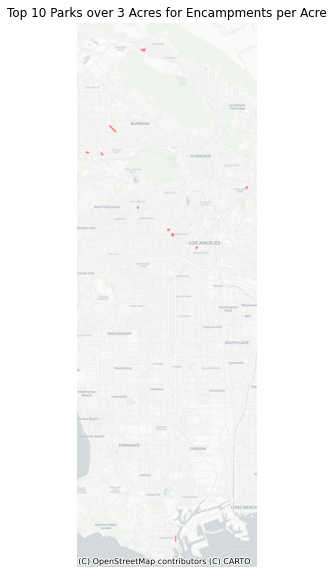

In [23]:
#this seems much more believable.
#in general I'm still iffy on normalization with this data at all
#because there is not a hugely strong correlation between size and report #s
#but hey, exploring is good
# map the top 10 large parks by number of encampment reports
ax = park_encamp_large.sort_values(by='encamp_per_acre',ascending=False)[:10].plot(figsize=(12,10),
                                                             color='red',
                                                             edgecolor='white',
                                                             alpha=0.5)


# title
ax.set_title('Top 10 Parks over 3 Acres for Encampments per Acre')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

## Calculate Significance - Spatial Weights & Lag

In [24]:
#Let's try to calculate spatial weights. 
#Not sure how this will work but again - experimenting to learn!
wq =  lps.weights.KNN.from_dataframe(park_encamp_large,k=8)
wq.transform = 'r'

/opt/conda/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning:

The weights matrix is not fully connected: 
 There are 2 disconnected components.



In [25]:
#so 2 of our parks aren't mapping
#I can live with that for the time being
# create a new column for the spatial lag
park_encamp_large['encamp_per_acre_lag'] = lps.weights.lag_spatial(wq, park_encamp_large['encamp_per_acre'])

In [26]:
#my sort by in this structure literally never works.
park_encamp_large.sort_values(by='encamp_per_acre_lag',ascending=False).sample(10)

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre,encamp_per_acre_lag
83,Garvanza Park,"POLYGON ((-13155831.859 4044672.784, -13155841...",243431.382649,5.588438,"6240 E Meridian St, LA 90042",Open Access,Neighborhood Park,1,1,14,Jose Huizar,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2,0.357882,2.998594
123,Lanark Recreation Center,"POLYGON ((-13202689.663 4057657.306, -13202691...",836281.45638,19.198457,"21816 W Lanark St, Canoga Park 91304",Open Access,Community Park,0,1,3,Bob Blumenfield,13,CANOGA PARK NC,TOPANGA,11,0.572963,0.980863
207,Sepulveda Basin Recreation Area,"POLYGON ((-13193503.564 4053689.915, -13193505...",67021260.0218,1538.602574,"17017 W Burbank Blvd, Encino 91316",Open Access,Community Regional Park,0,0,6,Nury Martinez,19,LAKE BALBOA NC,WEST VALLEY,2030,1.319379,2.201299
88,Granada Hills Recreation Center,"POLYGON ((-13190865.489 4063801.180, -13190866...",773433.820234,17.755668,"16730 W Chatsworth St, Granada Hills 91344",Open Access,Community Park,1,1,12,John Lee,118,GRANADA HILLS SOUTH NC,DEVONSHIRE,3,0.168960,0.927325
153,Montecito Heights Recreation Center,"POLYGON ((-13158199.412 4041477.137, -13158203...",981585.077137,22.534183,"4545 N Homer St, LA 90031",Open Access,Not Analyzed,0,0,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,40,1.775081,2.629980
247,Venice Beach,"POLYGON ((-13189430.356 4028419.002, -13189420...",7002380.33585,160.753176,"2300 S Ocean Front Walk, Venice 90291",Open Access,Neighborhood Park,0,0,11,Mike Bonin,68,VENICE NC,PACIFIC,172,1.069963,1.300972
212,Sheldon-Arleta Park,"POLYGON ((-13181504.857 4059385.393, -13181501...",1967102.03698,45.158630,"near Sheldon, Arleta & Hollywood Frwy, 12455 W...",Open Access,Community Regional Park,0,1,6,Nury Martinez,8,SUN VALLEY AREA NC,FOOTHILL,6,0.132865,0.871332
252,Victory-Vineland Recreation Center,"POLYGON ((-13177136.793 4054397.832, -13177125...",282336.452377,6.481579,"11117 W Victory Blvd, North Hollywood 91606",Open Access,Neighborhood Park,0,0,2,Paul Krekorian,24,NOHO NC,NORTH HOLLYWOOD,8,1.234267,3.745938
188,Ritchie Valens Recreation Center,"POLYGON ((-13184451.247 4064310.828, -13184452...",1122425.65025,25.767450,"10736 N Laurel Canyon Blvd, Pacoima 91331",Open Access,Community Park,0,2,7,Monica Rodriguez,7,PACOIMA NC,FOOTHILL,8,0.310469,0.406334
5,Albion Riverside Park,"POLYGON ((-13160733.448 4038228.744, -13160733...",276611.981393,6.350163,"1739 N Albion St, LA 90031",Open Access,Not Analyzed,0,0,14,Jose Huizar,47,LINCOLN HEIGHTS NC,HOLLENBECK,1,0.157476,0.804775


In [27]:
#well this is totally fascinaing
#these numbers correlate with where we understand encampments to be
#but haven't shown up in prior "top" charts
#color me impressed...
park_encamp_large.sort_values(by='encamp_per_acre_lag',ascending=False).head(10)

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre,encamp_per_acre_lag
141,MacArthur Park,"POLYGON ((-13166893.513 4036883.220, -13166890...",1301083.66164,29.868890,"2230 W 6th St, 90057",Open Access,Community Regional Park,0,1,1,Gilbert Cedillo,121,WESTLAKE SOUTH NC,RAMPART,83,2.778811,13.911841
158,Normandie Recreation Center,"POLYGON ((-13169223.181 4034894.586, -13169222...",142508.174306,3.271551,"1550 S Normandie Ave, LA 90006",Open Access,Neighborhood Park,0,0,10,Herb J. Wesson Jr.,76,PICO UNION NC,OLYMPIC,8,2.445324,13.752160
122,Lafayette Recreation Center,"POLYGON ((-13167434.608 4036991.354, -13167481...",423286.712199,9.717365,"625 S Lafayette Park Pl, LA 90057",Open Access,Neighborhood Park,1,1,1,Gilbert Cedillo,53,RAMPART VILLAGE NC,RAMPART,67,6.894873,13.397333
62,Echo Park,"POLYGON ((-13164890.373 4038302.402, -13164895...",1237402.39877,28.406964,"751 N Echo Park Blvd, LA 90026",Open Access,Community Regional Park,1,2,13,Mitch O'Farrell,44,GREATER ECHO PARK ELYSIAN NC,RAMPART,58,2.041753,12.956333
130,Lemon Grove Recreation Center,"POLYGON ((-13169766.213 4040619.036, -13169767...",168640.685869,3.871473,"4959 W Lemon Grove Ave, LA 90029",Open Access,Neighborhood Park,0,0,13,Mitch O'Farrell,33,HOLLYWOOD STUDIO DISTRICT NC,HOLLYWOOD,17,4.391094,10.519185
22,Barnsdall Park,"POLYGON ((-13168695.121 4042361.684, -13168696...",635668.513242,14.592999,"4800 W Hollywood Blvd, LA 90027",Open Access,Community Park,0,0,13,Mitch O'Farrell,36,LOS FELIZ NC,NORTHEAST,50,3.426300,10.230987
25,Bellevue Recreation Center,"POLYGON ((-13167202.544 4040300.678, -13167195...",396696.915467,9.106944,"826 N Lucille Ave, LA 90026",Open Access,Neighborhood Park,1,1,13,Mitch O'Farrell,38,SILVER LAKE NC,RAMPART,2,0.219613,10.172833
206,Seoul International Park,"POLYGON ((-13169379.569 4035947.552, -13169385...",150995.051839,3.466383,"3250 W San Marino St, LA 90006",Open Access,Neighborhood Park,0,0,10,Herb J. Wesson Jr.,55,WILSHIRE CENTER - KOREATOWN NC,OLYMPIC,9,2.596366,9.704514
214,Silver Lake Meadows Park,"POLYGON ((-13164939.898 4041936.946, -13164939...",150216.307498,3.448506,"2543 N Armstrong Ave, LA 90039",Open Access,Neighborhood Park,0,0,13,Mitch O'Farrell,38,SILVER LAKE NC,NORTHEAST,2,0.579961,8.731812
103,Hollywood Recreation Center,"POLYGON ((-13172323.704 4041360.855, -13172312...",135760.05451,3.116634,"1122 N Cole Ave, LA 90038",Open Access,Pocket Park,0,0,13,Mitch O'Farrell,32,CENTRAL HOLLYWOOD NC,HOLLYWOOD,28,8.984050,8.517200


## Analyze Spatial Weights & Lags

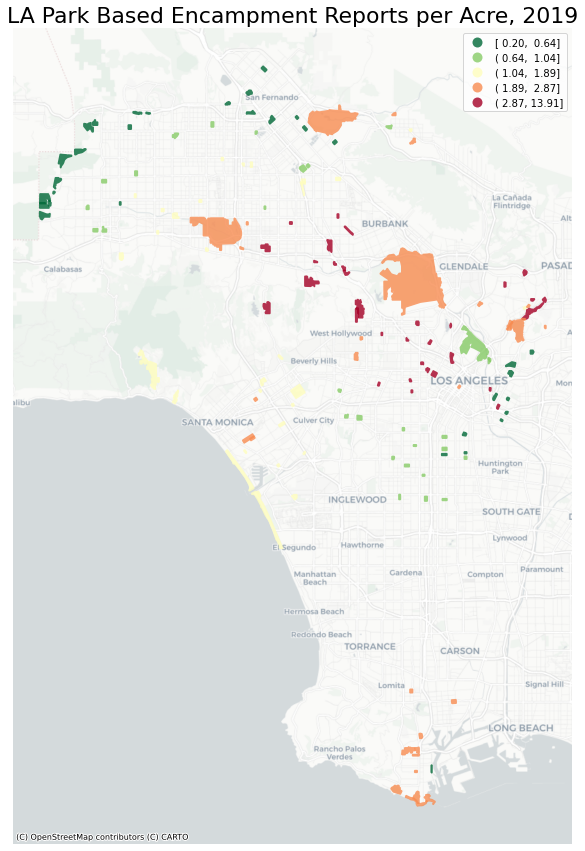

In [28]:
#map my spatial lag column
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
park_encamp_large.plot(ax=ax,
         figsize=(15,15),
         column='encamp_per_acre_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

# uncomment this to see the actual point locations of arrests
# arrests.plot(ax=ax, 
#              color='blue',
#              markersize =1,
#              alpha=0.2, 
#              legend=True)

ax.axis('off')
ax.set_title('LA Park Based Encampment Reports per Acre, 2019',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

This map has proved my fear of normalization wrong (shocker - proven mathmatical methods work). Notice how Sepulveda Basin and the Dam rec area are both still concentrated - so even with normalization they are still sites of note. Great! Venice beach dropping down is suprising though.

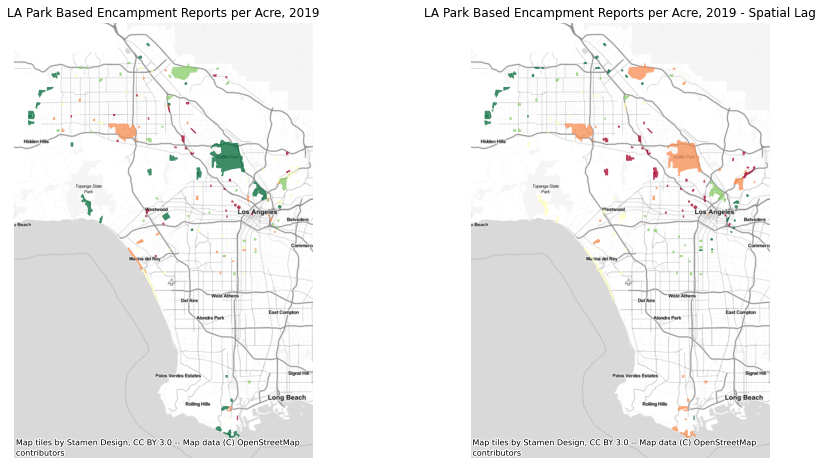

In [29]:
#side by side map to show impact
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
park_encamp_large.plot(column='encamp_per_acre', 
            cmap='RdYlGn_r', 
            scheme='quantiles',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1 # this assigns the map to the subplot
           )
ctx.add_basemap(ax1,source=ctx.providers.Stamen.TonerLite)
ax1.axis("off")
ax1.set_title("LA Park Based Encampment Reports per Acre, 2019")

# spatial lag map on the right
park_encamp_large.plot(column='encamp_per_acre_lag', 
            cmap='RdYlGn_r', 
            scheme='quantiles',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2 # this assigns the map to the subplot
           )
ctx.add_basemap(ax2,source=ctx.providers.Stamen.TonerLite)
ax2.axis("off")
ax2.set_title("LA Park Based Encampment Reports per Acre, 2019 - Spatial Lag")


plt.show()

In [30]:
#Besides the fact that this is too small to see, I'm very happy with this!
#time to try interactive
# interactive version needs to be in WGS84
park_encamp_large_web = park_encamp_large.to_crs('EPSG:4326')

In [31]:
#find the centroid
minx, miny, maxx, maxy = park_encamp_large_web.geometry.total_bounds
center_lat_park_encamp_large_web = (maxy-miny)/2+miny
center_lon_park_encamp_large_web = (maxx-minx)/2+minx

In [32]:
#get stats to manually set scale values
park_encamp_large_web.encamp_per_acre_lag.describe()

count    153.000000
mean       2.301962
std        2.714242
min        0.204148
25%        0.725118
50%        1.546802
75%        2.714286
max       13.911841
Name: encamp_per_acre_lag, dtype: float64

In [33]:
# grab the median
median = park_encamp_large_web.encamp_per_acre_lag.median()

In [34]:
#insert mapbox token (this is Yoh's token, thanks Yoh)
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [35]:
fig = px.choropleth_mapbox(park_encamp_large_web, 
                     geojson=park_encamp_large_web.geometry, 
                     locations=park_encamp_large_web.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='encamp_per_acre_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['name','type','freq','encamp_per_acre','encamp_per_acre_lag'],
                     center = {"lat": center_lat_park_encamp_large_web, "lon": center_lon_park_encamp_large_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'encamp_per_acre_lag':'Encampment Reports per Acre (Spatial Lag)',
                             'encamp_per_acre':'Encampment Reports per Acre',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

## Calculate Significance - Moran's Plot

In [36]:
#starting gloabl autocorrelation with Moran's Plot
y = park_encamp_large.encamp_per_acre
moran = Moran(y, wq)
moran.I

0.04626355352822466

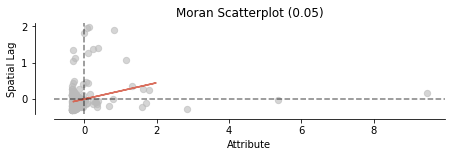

In [37]:
#which looks like this
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f0b1e5227f0>)

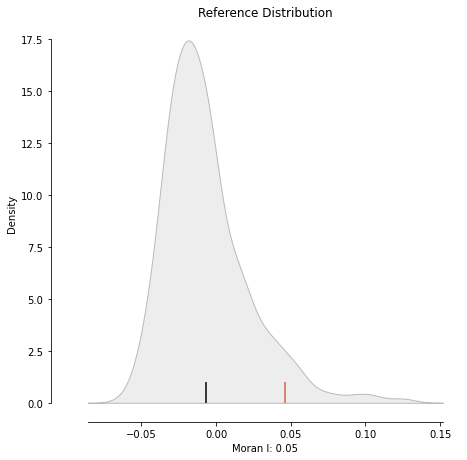

In [38]:
#What's the significance? Compare to 999 random permutations.
#This seems like a weak significance, right?
plot_moran_simulation(moran,aspect_equal=False)

## Calculate Significance - P Value

In [39]:
#calculate P value
moran.p_sim

0.057

## Calculate Significance - P & Moran Value Analysis

In [40]:
#now we can do local spatial autocorrelation
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

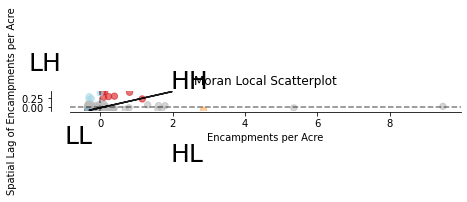

In [41]:
# Plot
#the colored dots represents the rows that have a P-value less that 0.05 
#these are the statisticaly significantly, spatially autocorrelated geographies

fig, ax = moran_scatterplot(lisa, p=0.05)
ax.set_xlabel("Encampments per Acre")
ax.set_ylabel('Spatial Lag of Encampments per Acre')
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1.5, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

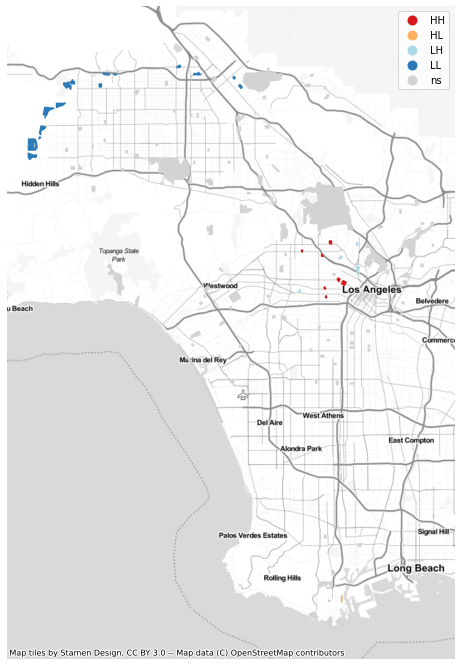

In [42]:
#let's see em on a map
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, park_encamp_large, p=0.05, ax=ax)
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)
plt.show()

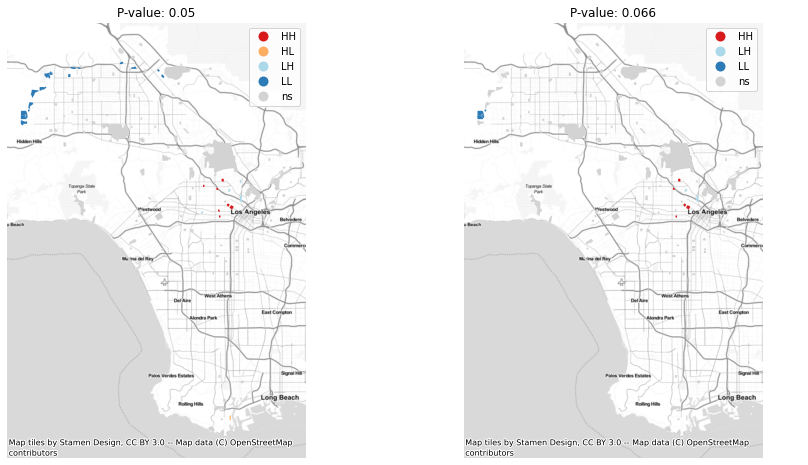

In [43]:
#mountain fringes are low and downtown/Westlake is high - that makes sense
#we can test different P values too

# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# name each subplot
ax1, ax2 = axs

#.05 P value on the left
lisa_cluster(lisa, park_encamp_large, p=0.05, ax=ax1)

ax1.axis("off")
ax1.set_title("P-value: 0.05")
ctx.add_basemap(ax1,source=ctx.providers.Stamen.TonerLite)

# previously calculated P value on right
lisa_cluster(lisa, park_encamp_large, p=0.01, ax=ax2)
ax2.axis("off")
ax2.set_title("P-value: 0.066")
ctx.add_basemap(ax2,source=ctx.providers.Stamen.TonerLite)

plt.show()

In [44]:
#Finally, let's get an interactive version of these significant parks
# original value list
lisa.y[:5]

array([58.67350548, 34.03219833, 19.10646185, 12.74450033, 12.19430237])

In [45]:
# quadrant list
lisa.q[:5]

array([1, 4, 4, 1, 4])

In [46]:
# p sim list
lisa.p_sim[:5]

array([0.128, 0.335, 0.033, 0.135, 0.5  ])

In [47]:
# add quadrant numbers to the dataframe
park_encamp_large['q'] = lisa.q.tolist()

In [48]:
# add individual p-values to the dataframe
park_encamp_large['p_sim'] = lisa.p_sim.tolist()

In [49]:
park_encamp_large.head()

,name,geometry,park_area,park_acres,address,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq,encamp_per_acre,encamp_per_acre_lag,q,p_sim
211,Shatto Recreation Center,"POLYGON ((-13167986.847 4038096.905, -13167977...",237571.355728,5.453910,"3191 W 4th St, LA 90020",Open Access,Neighborhood Park,0,1,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,320,58.673505,3.099267,1,0.128
175,Pershing Square,"POLYGON ((-13164035.567 4035141.724, -13164044...",193273.841037,4.436975,"525 S Olive St, LA 90013",Open Access,Neighborhood Park,0,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,151,34.032198,1.931833,4,0.335
202,San Pedro Plaza Park,"POLYGON ((-13166974.258 3992825.568, -13166980...",152749.805211,3.506667,"700 S Beacon St, San Pedro 90731",Open Access,Pocket Park,0,0,15,Joe Buscaino,95,CENTRAL SAN PEDRO NC,HARBOR,67,19.106462,0.332942,4,0.033
154,Moorpark Park,"POLYGON ((-13179505.802 4049176.348, -13179502...",140135.18061,3.217074,"12061 W Moorpark St, Studio City 91604",Open Access,Pocket Park,0,0,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,41,12.744500,3.558945,1,0.135
100,Highland Park Recreation Center,"POLYGON ((-13156560.031 4043777.979, -13156571...",235761.621543,5.412364,"6150 E Piedmont Ave, LA 90042",Open Access,Neighborhood Park,0,0,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,66,12.194302,1.360039,4,0.500


In [50]:
#with these numbers in place, we can make a hotspot map
# identify just the hotspot geographies
hot_spots = park_encamp_large[(park_encamp_large.p_sim < 0.05) & (park_encamp_large.q == 1)]

In [51]:
hot_spots.shape

(7, 19)

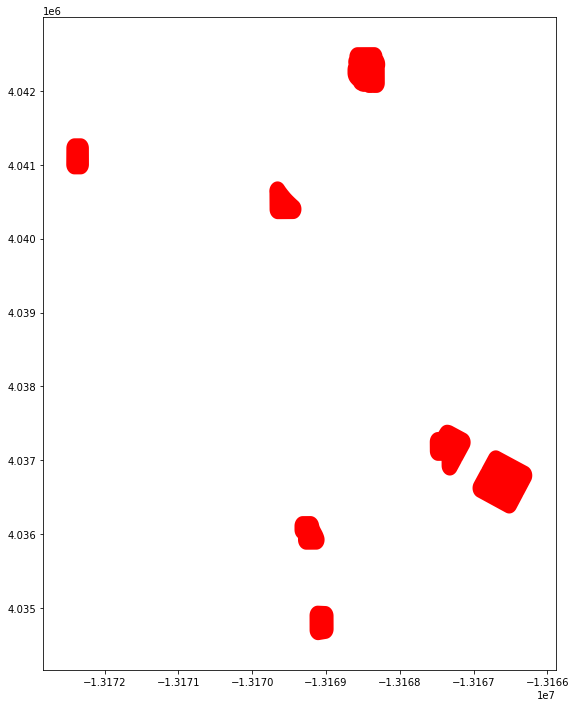

In [52]:
# quick plot - no more downtown parks! We have Westlake here
#and Hollywood? I forget what is directly north
hot_spots.plot(figsize=(12,12),color='red',legend=True,categorical=True)

In [53]:
# interactive version needs to be in WGS84
hot_spots = hot_spots.to_crs('EPSG:4326')

In [54]:
# what's the centroid?
minx, miny, maxx, maxy = hot_spots.geometry.total_bounds
center_lat_hot_spots = (maxy-miny)/2+miny
center_lon_hot_spots = (maxx-minx)/2+minx

In [55]:
fig = px.choropleth_mapbox(hot_spots, 
                     geojson=hot_spots.geometry, 
                     locations=hot_spots.index, 
                     mapbox_style="satellite-streets",
                     center = {"lat": center_lat_hot_spots, "lon": center_lon_hot_spots},
                     zoom=9, 
                     opacity=0.6,
                     color='encamp_per_acre_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['name','freq','encamp_per_acre','encamp_per_acre_lag'],
                     labels={
                             'encamp_per_acre_lag':'Encampment Reports per Acre (Spatial Lag)',
                             'encamp_per_acre':'Encampment Reports per Acre',
                     })
fig.update_traces(marker_line_width=1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

## Spatial Autocorrelation Analysis Conlusions
Spatial Autocorrelation reveals a cluster of statistically significant park based encampment reports in Westlake and Hollywood. This is after normalizing for park acerage. This correlates with field experience as someone who has been studying both Westlake housing status and park based encampments for a while, and reveals correlations not otherwise visible in the data.

# Thorough Point Pattern Analysis
The Seaborn graphs I am going to use only work with point geometry, not polygons. I could derive this from park centerpoints, or using the existing park attributes file..... Or I could be a little lazy and just look at overall encampment reports, particularly as I covered park-based encampments above.

## Setup

In [56]:
#This all needs to be done in Web Mercator
encamp_19 = encamp_19.to_crs('EPSG:3857')

In [57]:
#get those x's and y's (aka why this needs to be points)
encamp_19['x'] = encamp_19.geometry.x
encamp_19['y'] = encamp_19.geometry.y

In [58]:
#I need a refresher on what variables I have to work with - not many really
encamp_19.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,x,y
0,8/26/2019 13:56,Y,N,33.70633171,-118.2929289,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-13168308.610 3989437.384),-1.316831e+07,3.989437e+06
1,2/23/2019 12:47,Y,N,33.70971583,-118.2864142,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-13167583.397 3989890.238),-1.316758e+07,3.989890e+06
2,6/30/2019 21:42,Y,,33.71047284,-118.2862046,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-13167560.064 3989991.541),-1.316756e+07,3.989992e+06
3,6/30/2019 17:34,Y,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-13168316.825 3990126.758),-1.316832e+07,3.990127e+06
4,7/2/2019 15:15,Y,,33.71372994,-118.293106,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-13168328.324 3990427.418),-1.316833e+07,3.990427e+06


In [59]:
# create a subset
data_mini = encamp_19

## Graphing

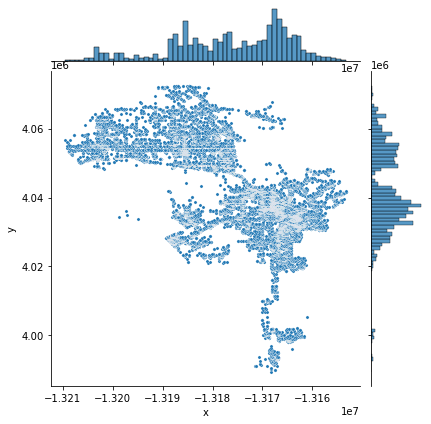

In [60]:
#pretty amazing - we can see the lat/longs with most freq encampment reports
#again a downtown concentration is clear
# scatterplot with edges
g = sns.jointplot(data = data_mini,
                  x='x', 
                  y='y',
                  s=10)

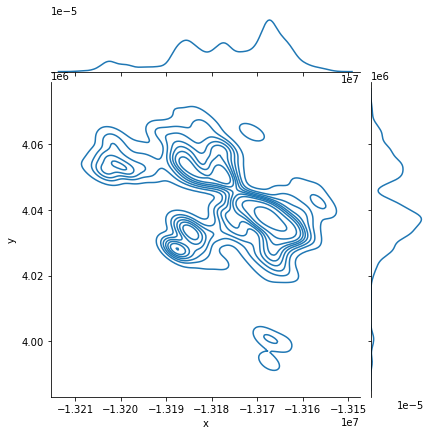

In [61]:
# kde plot further emphasizes this
sns.jointplot(data = data_mini,
              x='x', 
              y='y', 
              kind='kde')

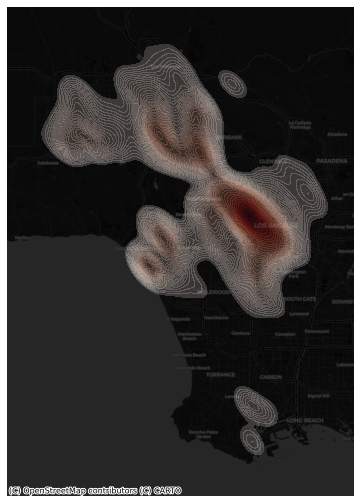

In [62]:
#lets see our hotspots
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# kdeplot, i.e. heat map
sns.kdeplot(x = data_mini.x, 
            y = data_mini.y,
            n_levels=50, 
            shade=True,
            thresh=0.05,
            alpha=0.2, 
            cmap='Reds')

# axes
ax.axis('off')

# basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

## Visualizing Mean and Median Centers

In [63]:
# compute the mean and median centers 
#to be able to see clearer patterns
mean_center = centrography.mean_center(encamp_19[['x','y']])
med_center = centrography.euclidean_median(encamp_19[['x','y']])

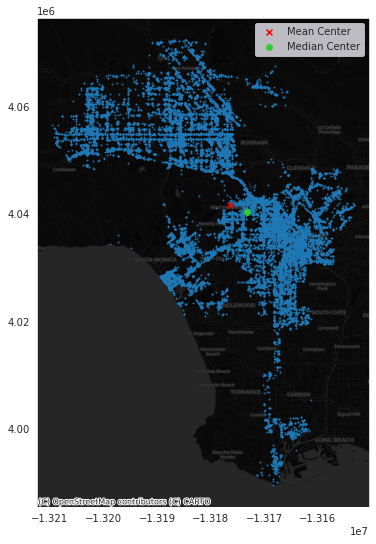

In [64]:
# set the style without grid lines
#mean and median center are in similar locations
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(encamp_19['x'], encamp_19['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

ax.legend()

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)
# Display
plt.show()

In [65]:
#set up ellipses
major, minor, rotation = centrography.ellipse(encamp_19[['x','y']])

## Analyizing Mean and Median Centers

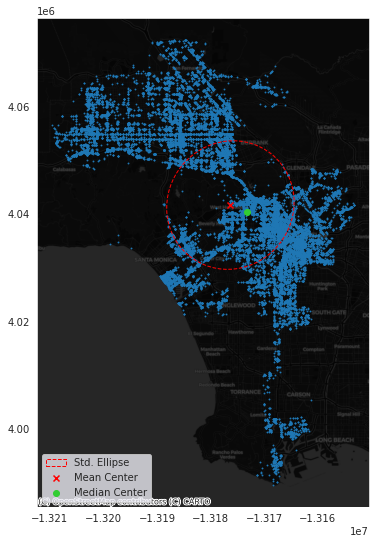

In [66]:
#wow- 
#does the standard ellipse being a circle 
#mean that encampments are relatively evenly distributed?
# set the style without grid lines
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(encamp_19['x'], encamp_19['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', linestyle='--',
                  label='Std. Ellipse')

ax.add_patch(ellipse)

ax.legend()

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)

# Display
plt.show()

## Interactive Encampment Report Analysis by Council District

In [69]:
#such a powerful tool!!!

@interact
def encamp_ellipse(cd=encamp_19.cd.unique().tolist()):
    # filter the data by cd
    encamp_filtered = encamp_19[encamp_19.cd == cd]

    # mean center and median
    mean_center = centrography.mean_center(encamp_filtered[['x','y']])
    med_center = centrography.euclidean_median(encamp_filtered[['x','y']])

    # standard ellipse
    major, minor, rotation = centrography.ellipse(encamp_filtered[['x','y']])

    # Set up figure and axis
    f, ax = plt.subplots(1, figsize=(9, 9))

    # plot arrest points
    ax.scatter(encamp_filtered['x'], encamp_filtered['y'], s=0.75)

    # add the mean and median center points
    ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
    ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

    # heatmap
    sns.kdeplot(x = encamp_filtered.geometry.x, 
                y = encamp_filtered.geometry.y,
                n_levels=20, 
                shade=False,
                thresh=0.1,
                alpha=0.3, 
                cmap='Reds', 
                ax=ax)

    # Construct the standard ellipse using matplotlib
    ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                      width=major*2, # centrography.ellipse db_filtered
                      height=minor*2, 
                      angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                      facecolor='none', 
                      edgecolor='red', linestyle='--',
                      label='Std. Ellipse')

    ax.add_patch(ellipse)

    ax.legend()

    ax.axis('Off')

    ax.set_title(str(len(encamp_filtered)) + ' encampments reported in Council District ' + cd + '')

    # add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.DarkMatter)
    # Display
    plt.show()

interactive(children=(Dropdown(description='cd', options=('15', '8', '11', '9', '10', '5', '14', '1', '4', '13…

## Thorough Point Pattern Analysis Conclusions
As expected and similar to park-based encampment reports, encampment reports are concentrated in Downtown LA. Venice Beach constitutes another center, as do Sepulveda Basin and the Dam Recreation Area. There are a couple of less explored hotspots down by San Pedro.

Overall, a similarly placed mean/median and a nearly round ellipse indicate that encampments reports are, overall, evenly scattered throughout the city. This is both sad, and a little suprising. Then again, it is worth remembering that these are REPORTS, not overall encampment occurances.

The story on a council-district level is more nuanced, with more uneven spreads. Somewhat surprisingly, there tend to be more than one hotspot per council district.